# Instruções da prova

- O único material que poderá ser consultado é este notebook, consultas à outros materiais ou à internet será considerado cola levando à nota zero na prova
- Renomear o notebook para NOME_SOBRENOME_MATRICULA
- Enviar o arquivo .ipynb na tarefa do TEAMS.

# Parte teórica

Classifique as afirmações em Verdadeiro ou Falso, justifique as afirmativas falsas

1 - Um vídeo tem uma taxa de atualização de 28 fps. Se a função fl_image(func) for
aplicada num intervalo de 3 a 5 segundos, pode-se afirmar que a função func foi
aplicada em 84 quadros.

In [ ]:
Verdadeiro.

2 - O formato GIF surgiu como uma evolução do formado PNG, uma das suas vantagens é a possibilidade de representar muito mais cores.

In [ ]:
Falso. O formato PNG é uma evolução do formato GIF.

3 - A compressão JPEG consegue bons resultados sem perda de qualidade pois retira da imagem informações muito perceptíveis ao olho humano.

In [ ]:
Falso. O formato JPEG é um metódo de compressao com perdas.

4 - Histogramas de duas imagens distintas não serão nunca iguais

In [ ]:
Verdadeiro.

5 - O método RLE de compressão de dados sempre gera um resultado com menor quantidade de dados (comprimido).

In [ ]:
Falso. O meto RLE nem sempre gera um resultado com menor quantidade de dados.

# Parte prática

## Material de apoio

### Importações

```
import moviepy.editor as mpe
import numpy as np
import matplotlib.pyplot as plt
```

### Histograma
```
def histogram_gray(img):
    (l, c) = img.shape
    # Histograma com 1 linha e 256 colunas, preenchido com 0.
    histogram = np.zeros(256, dtype=np.int32)

    for i in range(l):
        for j in range(c):
            # Normalizar intensidade do pixel 
            intensity = img[i, j]
            # Incrementar de 1 a quantidade de pixels no histograma,
            # utilizando a intensidade como índice.
            histogram[intensity] += 1
            
    return histogram

def show_histogram(img):
    histogram_r = histogram_gray(img[:, :, 0])
    histogram_g = histogram_gray(img[:, :, 1])
    histogram_b = histogram_gray(img[:, :, 2])
    
    plt.figure(figsize=(16, 16))
    plt.subplot(2, 1, 1)
    plt.bar(range(256), histogram_r, color='red')
    plt.bar(range(256), histogram_g, color='green')
    plt.bar(range(256), histogram_b, color='blue')

```

### Manipulação de imagens

```
(l,c,p) = img.shape
plt.imshow(imagem)
```

### Forçando uma imagem de uma página para 3 páginas
```
  imagem_3p = np.zeros(shape=(l,c,p),dtype=np.uint8)
  imagem_3p[:,:, 0] = frame_1p
  imagem_3p[:,:, 1] = frame_1p
  imagem_3p[:,:, 2] = frame_1p
```

### Detecção de bordas
```
    imagem_grey = np.average(frame, axis=2).astype(np.float64)
   
    abs_tg_c = np.abs(np.diff(imagem_grey.astype(np.float64), axis=0, append=255))
    abs_tg_l = np.abs(np.diff(imagem_grey.astype(np.float64), axis=1, append=255))
    abs_tg = np.sqrt(abs_tg_c ** 2 + abs_tg_l ** 2)

    imagem_border = np.zeros(shape=(l, c), dtype=np.uint8)
    imagem_border[abs_tg > threshold] = 255
```

### Manipulação de vídeo
```
video = mpe.VideoFileClip("video.mp4")
frame = video.get_frame(2 / video.fps)
frame = video.get_frame(2)
video.ipython_display(width=480)
video_modificado = video.fl_image(func_modificar)
subclip = video.subclip(0,2)
subclip = video.subclip(3)
parts = mpe.concatenate_videoclips([part1, part])
video.write_videofile('video.mp4')
```

### Conversão CM|Y
```
img_cmy = 255 - img_rgb
```

### Reflexão utilizando numpy
```
    img_refl = np.zeros(shape=imagem.shape, dtype=np.uint8)
    img_refl[::1, ::-1] = imagem
```


**1 -** Importe as bibliotecas que serão usadas

In [ ]:
import moviepy.editor as mpe
import numpy as np
import matplotlib.pyplot as plt

**2 -** Abra o vídeo "boydancing.mp4" e salve-o em uma variável, pegue o **frame do indice 2** e o exiba.

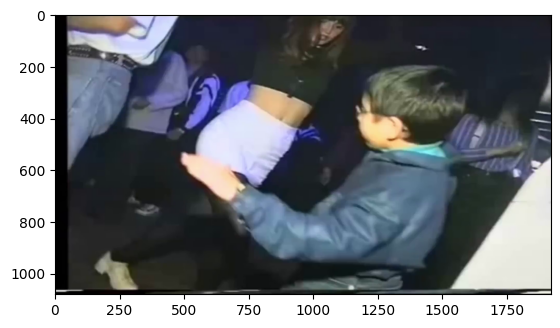

In [3]:
video = mpe.VideoFileClip("boydancing.mp4")
frame = video.get_frame(2 / video.fps)
plt.imshow(frame)

**3 -** Exiba o histograma RGB do frame selecionado.

In [ ]:
def show_histogram(frame):
    histogram_r = histogram_gray(frame[:, :, 0])
    histogram_g = histogram_gray(frame[:, :, 1])
    histogram_b = histogram_gray(frame[:, :, 2])

    plt.figure(figsize=(16, 16))
    plt.subplot(2, 1, 1)
    plt.imshow(frame, cmap='gray', vmin=0, vmax=255)
    plt.subplot(2, 1, 2)
    plt.bar(range(256), histogram_r, color='red')
    plt.bar(range(256), histogram_g, color='green')
    plt.bar(range(256), histogram_b, color='blue')

show_histogram(frame)


**4 -** Crie uma função que receba um frame e retorne um frame refletido em x e y, aplique essa função no vídeo e observe o resultado. 

In [ ]:
def reflect_frame(frame):
    height, width, _ = frame.shape

    reflected_frame = np.zeros_like(frame)

    reflected_frame = np.zeros(shape=frame.shape, dtype=np.uint8)
    reflected_frame[::-1, ::-1] = frame

    return reflected_frame

video.reflect = video.subclip(0).fl_image(reflect_frame)
video.reflect.ipython_display(width=480)

**5 -** Crie uma função que receba um frame e realize a detecção de bordas nele com **treshold de valor 10**, aplique essa função no vídeo e observe o resultado. **Sua função deve retornar um frame com 3 páginas para evitar problemas**.

In [30]:
def border_detect(frame):
    gray = np.average(frame, axis=2).astype(np.float64)
    
    abs_tg_c = np.abs(np.diff(gray, axis=0, append=255))
    abs_tg_l = np.abs(np.diff(gray, axis=1, append=255))
    abs_tg = np.hypot(abs_tg_c, abs_tg_l)
    
    l, c, p = frame.shape
    
    border = np.zeros(shape=(l, c), dtype=np.uint8)
    border[abs_tg > 10] = 255
    
    new_frame = np.zeros(shape=(l, c, p), dtype=np.uint8)
    
    new_frame[:, :, 0] = border
    new_frame[:, :, 1] = border
    new_frame[:, :, 2] = border
    return new_frame

video_borders = video.fl_image(border_detect)
video_borders.ipython_display(width=480)

Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


**6 -** Crie uma função que receba um frame e retorne esse frame convertido para o espaço de cor CMY

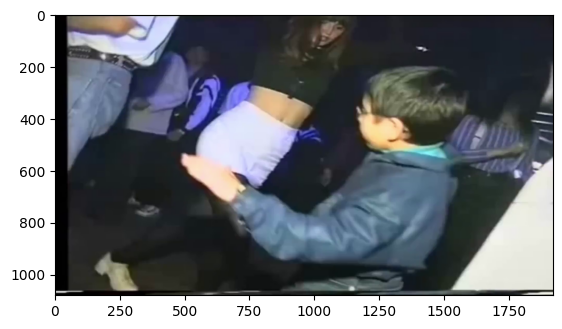

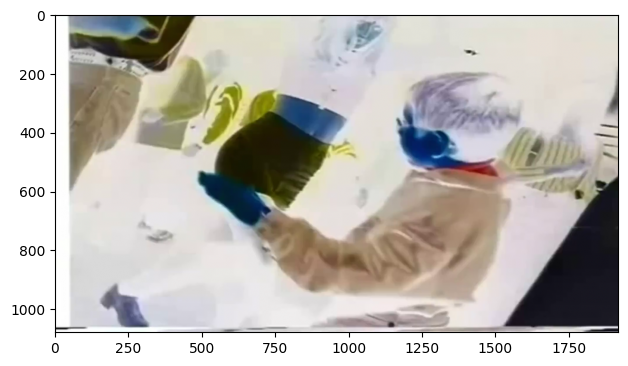

In [39]:
def convert_cmy (frame):

    frame_rgb = np.array(frame)
    l, c, p = frame_rgb.shape

    frame_cmy = np.zeros(shape=frame_rgb.shape, dtype=np.float64)
    frame_cmy = 255 - frame_rgb

    return frame_cmy

cmy = convert_cmy(frame)

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.imshow(frame)
plt.figure(figsize=(16, 16))
plt.subplot(1, 2, 1)
plt.imshow(cmy)

**7 -** Separe o vídeo original em 3 subclips:
- Segundos 0 ao 2: Aplicar conversão para cmy
- Segundos 2 ao 4: Aplicar reflexão no eixo x e y
- Segundos 4 em diante: Aplicar detecção de borda

**Una esses clips em um único vídeo e exiba o resultado.**

In [ ]:
part_1 = video.subclip(0, 2).fl_image(convert_cmy)
part_2 = video.subclip(2, 4).fl_image(reflect_frame)
part_3 = video.subclip(4).fl_image(border_detect)
parts = mpe.concatenate_videoclips([part_1, part_2, part_3])

t:  49%|████▉     | 72/147 [18:21<05:22,  4.30s/it, now=None]

In [ ]:
parts.ipython_display(width=480)

**8 -** Salve o vídeo resultante da última etapa com o nome "resultado.mp4".

In [ ]:
parts.write_videofile('resultado.mp4')